# Tongue's surface and depth cut extraction 

In [2]:
# Code Cell 1: helper functions for the analysis of tongue cuts and extracting cutting paths

#importing some useful packages
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2
import math
import csv
%matplotlib inline

###############Some general functions used in most of the steps

# Take two images with their titles and plot them next to each other
def plot2figs(fig1,title1,fig2,title2):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    # plot a color image 
    if len(fig1.shape) == 3:
        ax1.imshow(fig1)
    # or if it is black and white, use a gray color mapping
    else:
        ax1.imshow(fig1, cmap='gray')
    ax1.set_title(title1, fontsize=30)
    if len(fig2.shape) == 3:
        ax2.imshow(fig2)
    else:
        ax2.imshow(fig2, cmap='gray')
    ax2.set_title(title2, fontsize=30)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    plt.show()

# Take three images with their titles and plot them next to each other    
def plot3figs(fig1,title1,fig2,title2,fig3,title3):
    f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 9))
    f.tight_layout()
    if len(fig1.shape) == 3:
        ax1.imshow(fig1)
    else:
        ax1.imshow(fig1, cmap='gray')
    ax1.set_title(title1, fontsize=30)
    if len(fig2.shape) == 3:
        ax2.imshow(fig2)
    else:
        ax2.imshow(fig2, cmap='gray')
    ax2.set_title(title2, fontsize=30)
    if len(fig3.shape) == 3:
        ax3.imshow(fig3)
    else:
        ax3.imshow(fig3, cmap='gray')
    ax3.set_title(title3, fontsize=30)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    plt.show()
    
# converting to gray scale
def get_grayscale(img):
    return cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# converting to hsv 
def get_hsv(img):
    return cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

# filtering hsv color channels using thresholds 
def get_hsv_range(img, lower_green, upper_green):
    return cv2.inRange(img, lower_green,  upper_green)


# applying canndy edge detection
def canny(img, low_threshold, high_threshold):
    """Applies the Canny transform"""
    return cv2.Canny(img, low_threshold, high_threshold)

# image cropping function
def crop_image(img,top,bottom,left,right): 
    img = img[top:img.shape[0]-bottom, left:img.shape[1]-right]
    return cv2.resize(img,None,fx=1, fy=1, interpolation = cv2.INTER_AREA)
    #return img


#gaussian_blur for reducing noise before edge detection
def gaussian_blur(img, kernel_size):
    """Applies a Gaussian Noise kernel"""
    return cv2.GaussianBlur(img, (kernel_size, kernel_size), 0)


# read the test/image params
def get_params(file_name):
    csv_file = open(file_name, 'r')
    csv_reader = csv.reader(csv_file, delimiter=',')
    headers = next(csv_reader, None) # skips header values
    print('Reade the folloiwn items from ')
    print('file', file_name)
    print(headers)    
    for row in csv_reader:
        crop_top = int(row[0])
        crop_bottom = int(row[1])
        crop_left = int(row[2])
        crop_right = int(row[3])
        thresh_low = int(row[4])
        thresh_high = int(row[5])
        pix2mm = float(row[6])
    return crop_top, crop_bottom, crop_left, crop_right, thresh_low, thresh_high, pix2mm
        



Reade the folloiwn items from 
file ../data/12-12-2018/images/al3/params/al3_topview_params.csv
['crop_top', 'crop_bottom', 'crop_left', 'crop_right', 'thresh_low', 'thresh_high', 'pix2mm']
0 0 0 0 50 255 12.21
!!!!!!!!!!!MAKE SURE ABOUT SCALINGS, PIX2MM, and CROPPING!!!!!!!!!!!


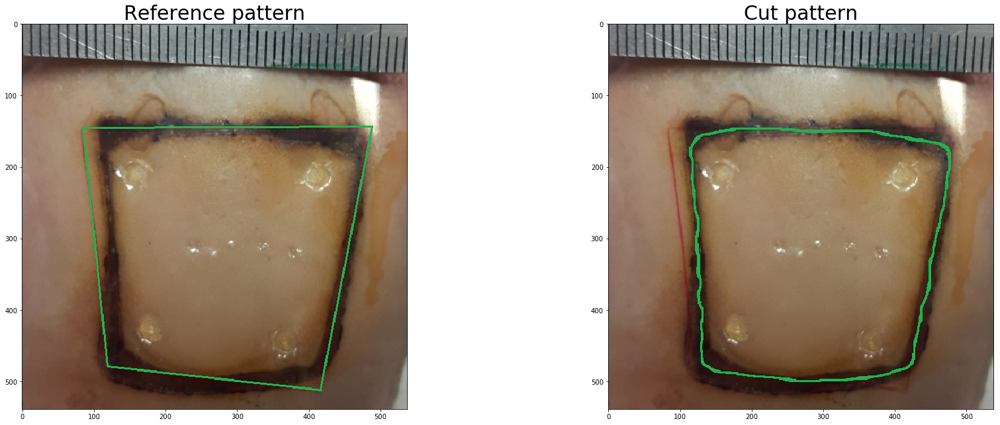

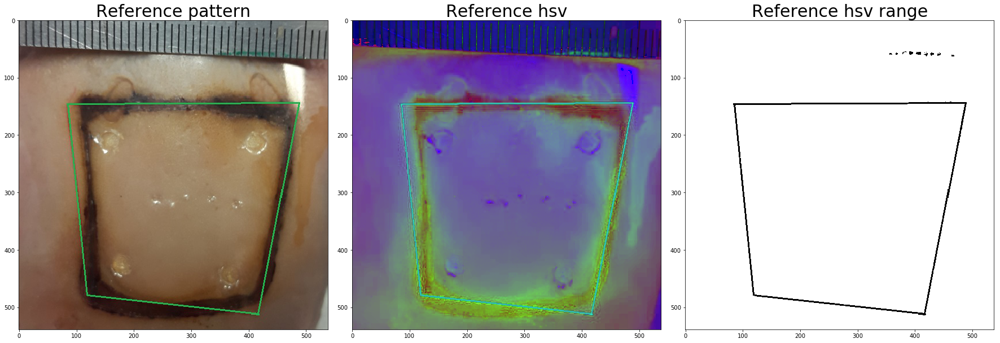

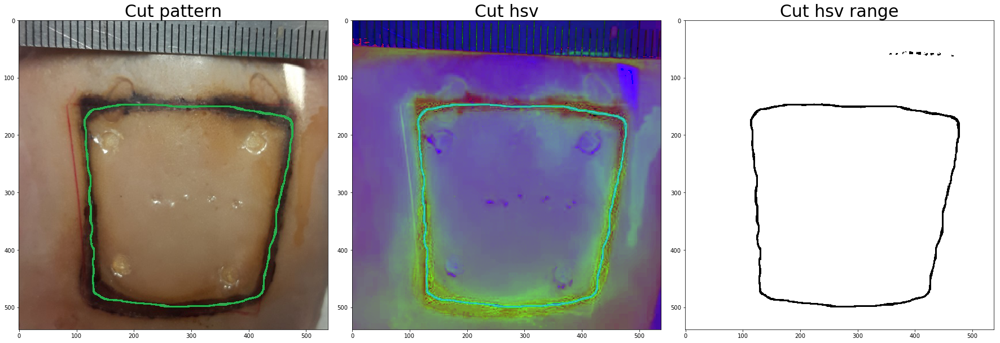

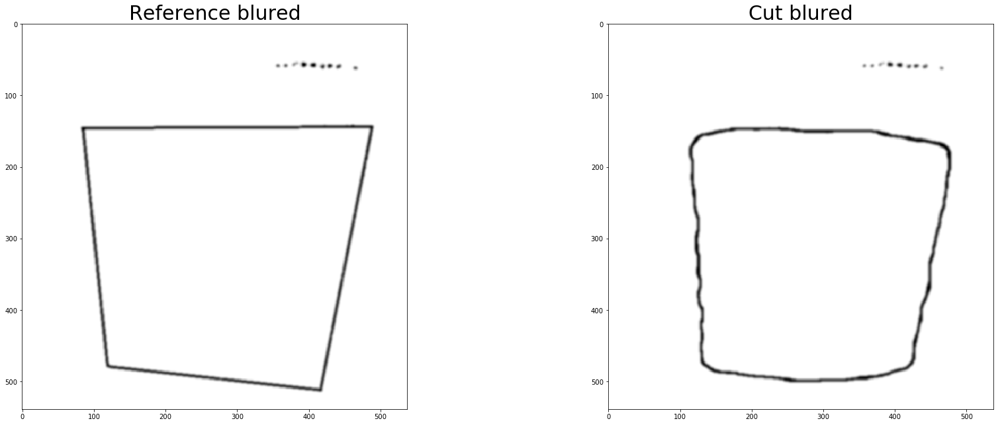

50


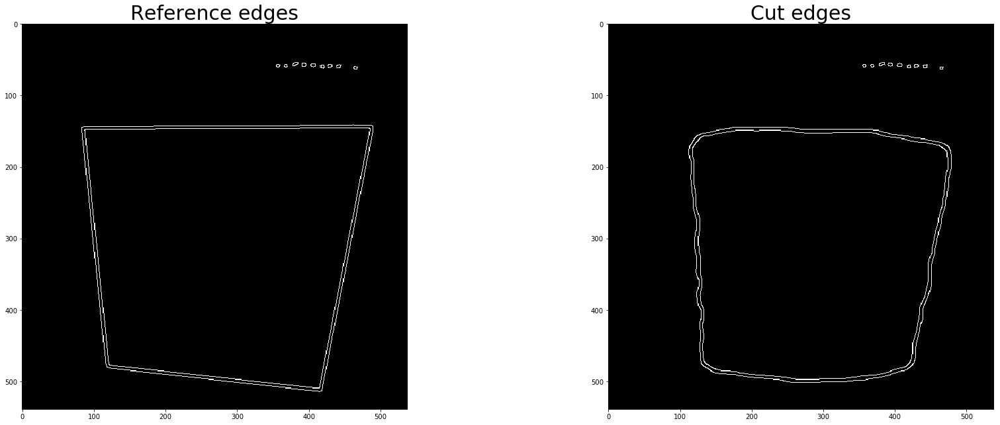

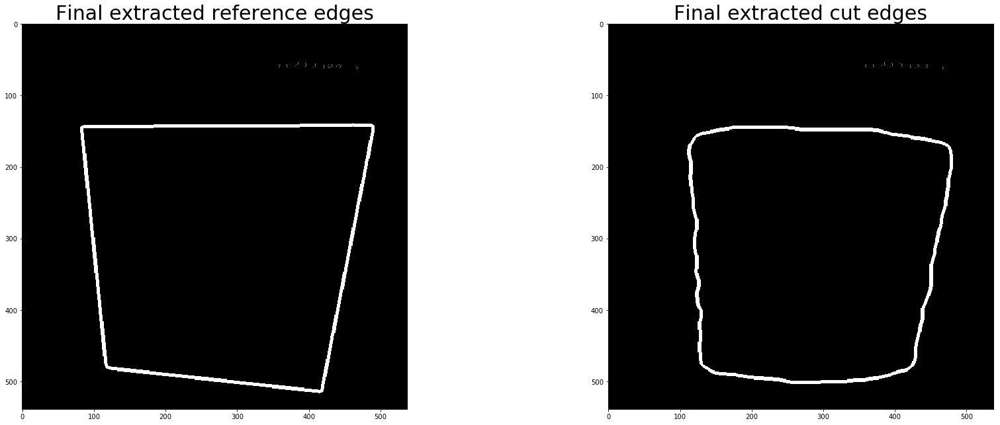

!!!!Saved the ref path!!!!
!!!!Saved the cut path!!!!


In [4]:
# some info about test number, date, location and etc
test_no = 'al3'
test_date = '12-12-2018/images/'
results_file_loc = '../data/'
source_file_loc = '../data/'
# reading the params file
topview_params_file_name = source_file_loc+test_date+test_no+"/params/"+test_no+"_topview_params.csv"
crop_top, crop_bottom, crop_left, crop_right, thresh_low, thresh_high, pix2mm = get_params(topview_params_file_name)
#get_side_params
print (crop_top, crop_bottom, crop_left, crop_right, thresh_low, thresh_high, pix2mm)
print("!!!!!!!!!!!MAKE SURE ABOUT SCALINGS, PIX2MM, and CROPPING!!!!!!!!!!!")


# reading the highlighted reference cut and performed cut images
ref_img_name = source_file_loc+test_date+test_no+"/"+test_no+'_ref.jpg'
ref_image = mpimg.imread(ref_img_name)
cut_img_name = source_file_loc+test_date+test_no+"/"+test_no+'_cutb.jpg'
cut_image = mpimg.imread(cut_img_name)
plot2figs(ref_image, 'Reference pattern',cut_image,'Cut pattern')
plt.show()


# set show_steps = True to see all of the processing steps (for debugging)
show_steps = True

# ranges for green color in hsv format (edges are highlighted in green for ease of proecessing)
lower_green = np.array([20, 100, 100])
upper_green = np.array([70, 255, 200])
# apply a color thresholding on the hsv image
ref_hsv = get_hsv(ref_image);
ref_hsv_range = 255- get_hsv_range(ref_hsv,lower_green ,upper_green )
if show_steps:
    plot3figs(ref_image, 'Reference pattern',ref_hsv,'Reference hsv', ref_hsv_range, "Reference hsv range")
    plt.show()

cut_hsv = get_hsv(cut_image);
cut_hsv_range = 255 - get_hsv_range(cut_hsv,lower_green ,upper_green )
if show_steps:
    plot3figs(cut_image, 'Cut pattern',cut_hsv,'Cut hsv', cut_hsv_range, "Cut hsv range")
    plt.show()


# cropp unnecesary boundaries if needed (usually not applied if the input image is cropped beforehand)
ref_cropped = crop_image(ref_hsv_range, crop_top, crop_bottom, crop_left, crop_right)
cut_cropped = crop_image(cut_hsv_range, crop_top, crop_bottom, crop_left, crop_right)
ref_height = ref_cropped.shape[0]

#preparing for Canny
kernel_size = 9 # Must be an odd number (3, 5, 7...)
ref_blur = gaussian_blur(ref_cropped,kernel_size)
cut_blur = gaussian_blur(cut_cropped,kernel_size)
if show_steps:
    plot2figs(ref_blur, 'Reference blured',cut_blur,'Cut blured')
    plt.show()

print(thresh_low)
ref_edges = canny(ref_blur, thresh_low, thresh_high)
cut_edges = canny(cut_blur, thresh_low, thresh_high)


if show_steps:
    plot2figs(ref_edges, 'Reference edges',cut_edges,'Cut edges')
    plt.show()

# find the longest contours in the image 
ref_contours_img, ref_contours, ref_hierarchy = cv2.findContours(ref_edges,cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)
cut_contours_img, cut_contours, cut_hierarchy = cv2.findContours(cut_edges,cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)

# show the longest contour
cv2.drawContours(ref_edges, ref_contours, 0, (255,0,0), 3)
cv2.drawContours(cut_edges, cut_contours, 0, (255,0,0), 3)
plot2figs(ref_edges, 'Final extracted reference edges',cut_edges,'Final extracted cut edges')
plt.show()


#prepare to save the resulting contours
ref_file_name = results_file_loc+test_date+test_no+"/results/"+test_no+'_ref.csv'
cut_file_name = results_file_loc+test_date+test_no+"/results/"+test_no+'_cut.csv'
 

# save the reference contour
ref_file = open(ref_file_name, 'w')  
writer1 = csv.writer(ref_file)
for row in range(0, ref_contours[0].shape[0]):
    writer1.writerows(ref_contours[0][row]/pix2mm)
    ref_file.flush()
ref_file.close() 
print('!!!!Saved the ref path!!!!')
# save the performed cut contour
cut_file = open(cut_file_name, 'w')  
writer2 = csv.writer(cut_file)
for row in range(0, cut_contours[0].shape[0]):
    writer2.writerows(cut_contours[0][row]/pix2mm)
    cut_file.flush()
cut_file.close() 

print('!!!!Saved the cut path!!!!')



Reade the folloiwn items from 
file ../data/12-12-2018/images/al3/params/al3_side1_params.csv
['crop_top', 'crop_bottom', 'crop_left', 'crop_right', 'thresh_low', 'thresh_high', 'pix2mm']
0 0 0 0 50 255 15.18
!!!!!!!!!!!MAKE SURE ABOUT SCALINGS, PIX2MM, and CROPPING!!!!!!!!!!!


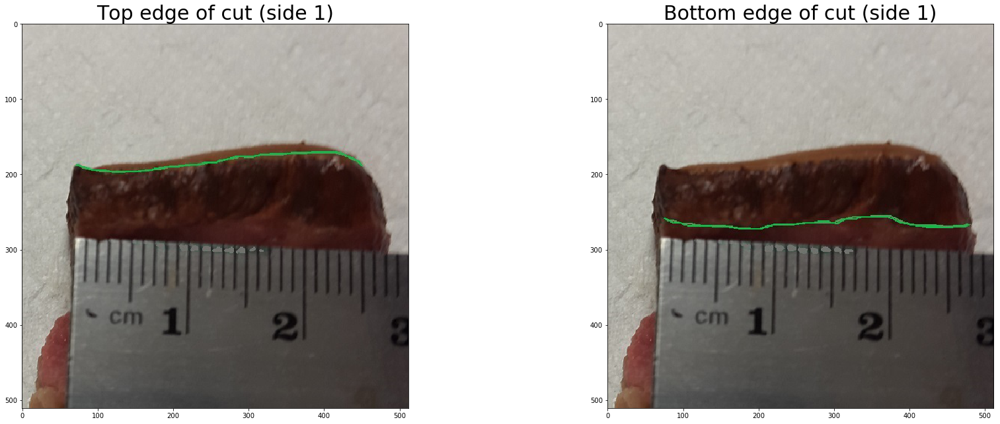

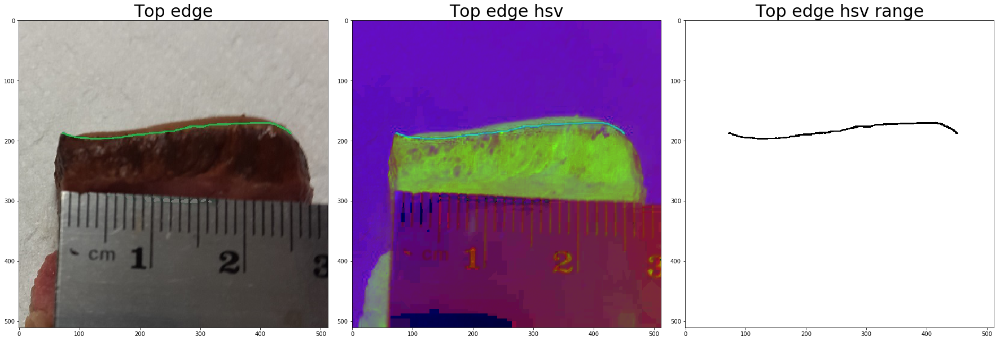

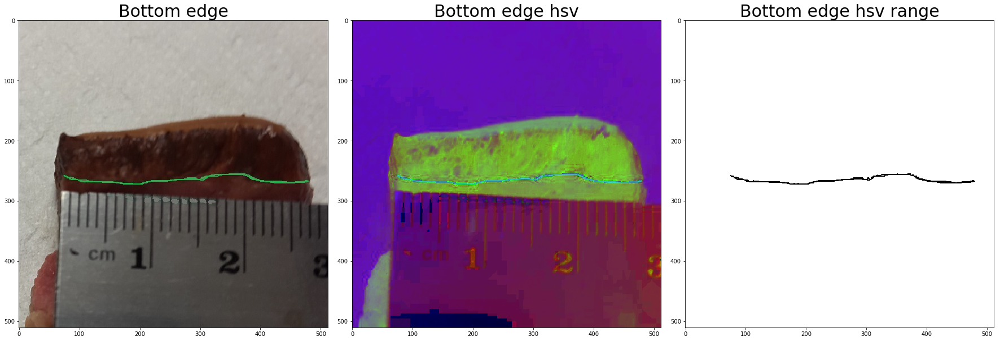

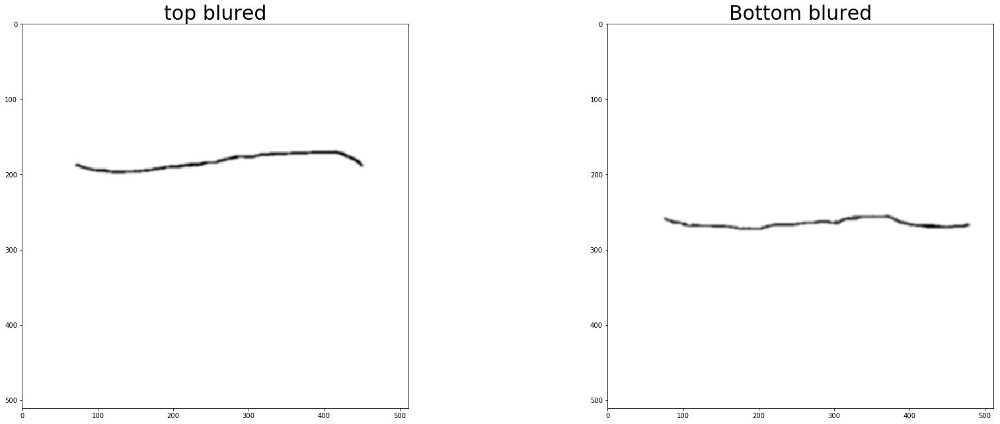

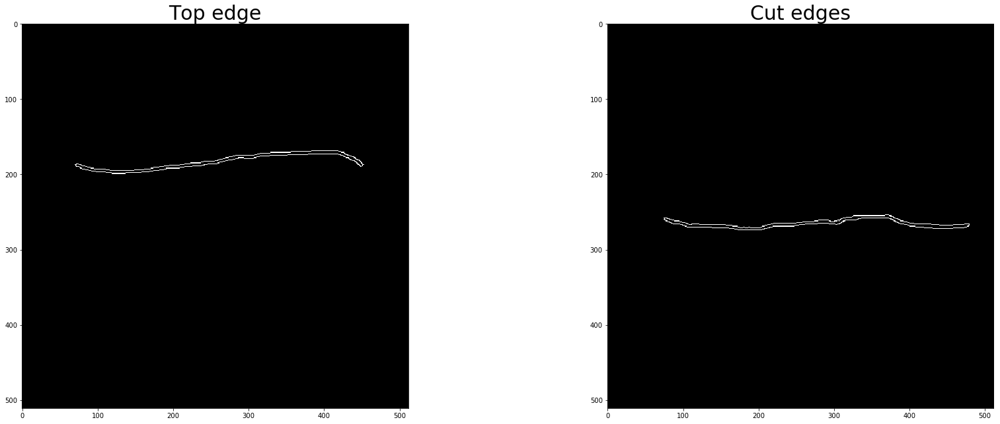

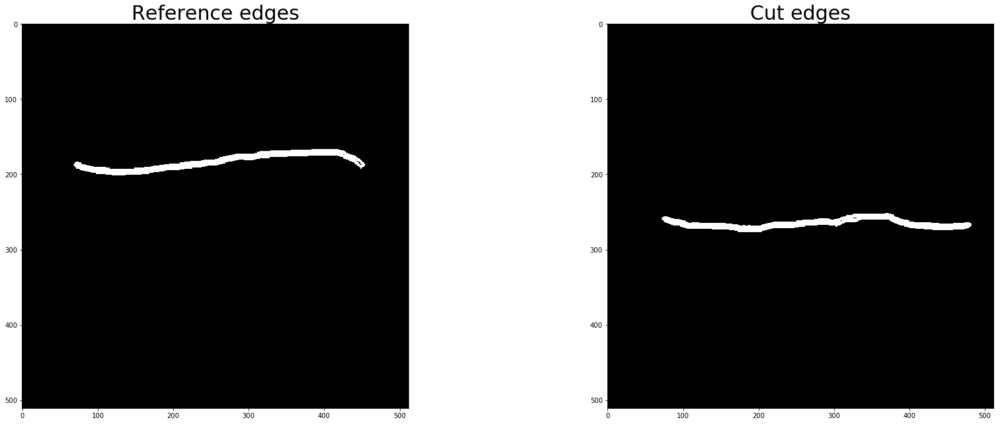

!!!!Saved the top edge!!!! 190
!!!!Saved the bottom!!!!  213
Reade the folloiwn items from 
file ../data/12-12-2018/images/al3/params/al3_side2_params.csv
['crop_top', 'crop_bottom', 'crop_left', 'crop_right', 'thresh_low', 'thresh_high', 'pix2mm']
0 0 0 0 50 255 13.801
!!!!!!!!!!!MAKE SURE ABOUT SCALINGS, PIX2MM, and CROPPING!!!!!!!!!!!


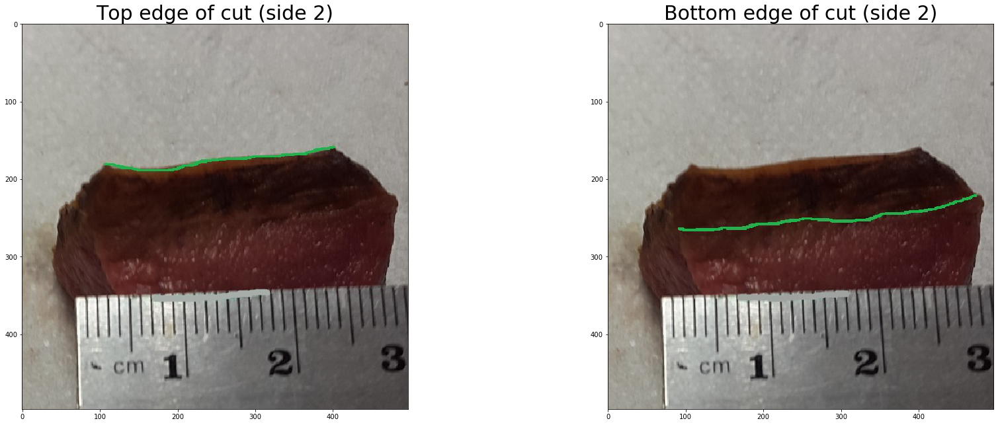

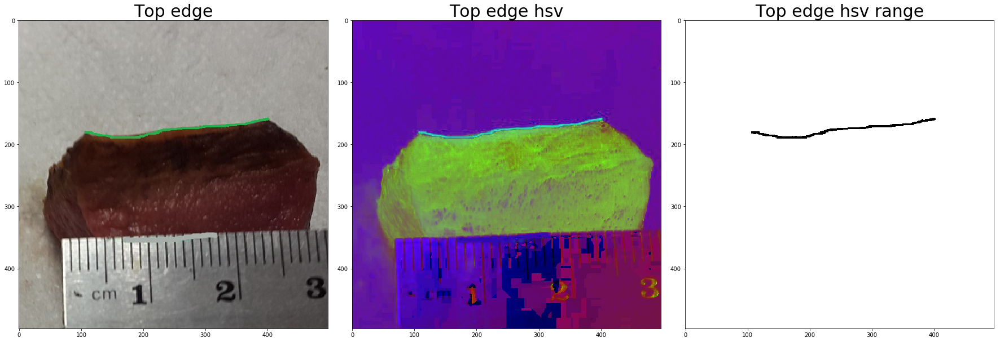

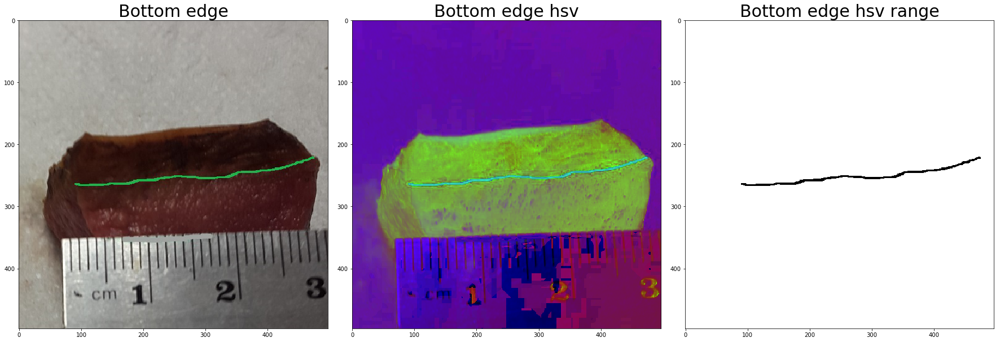

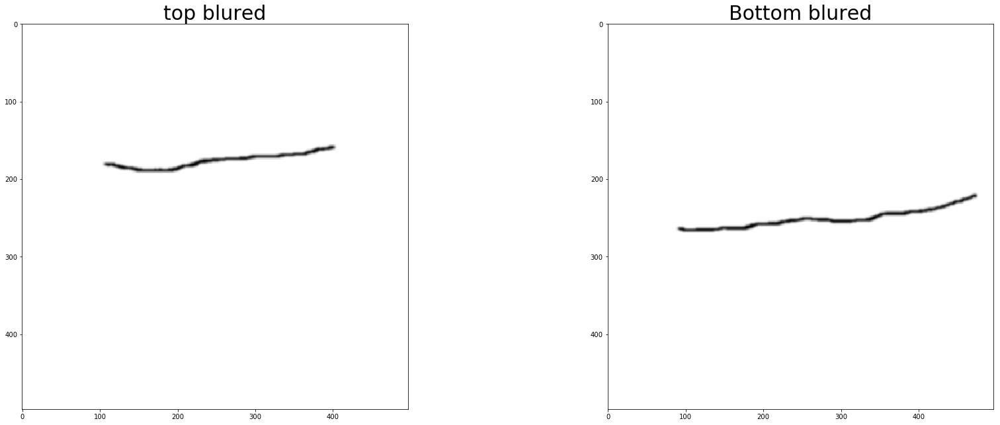

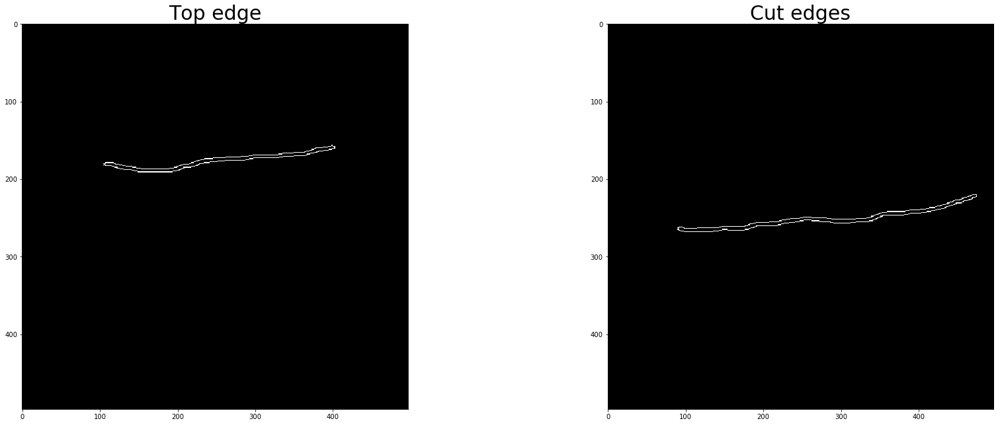

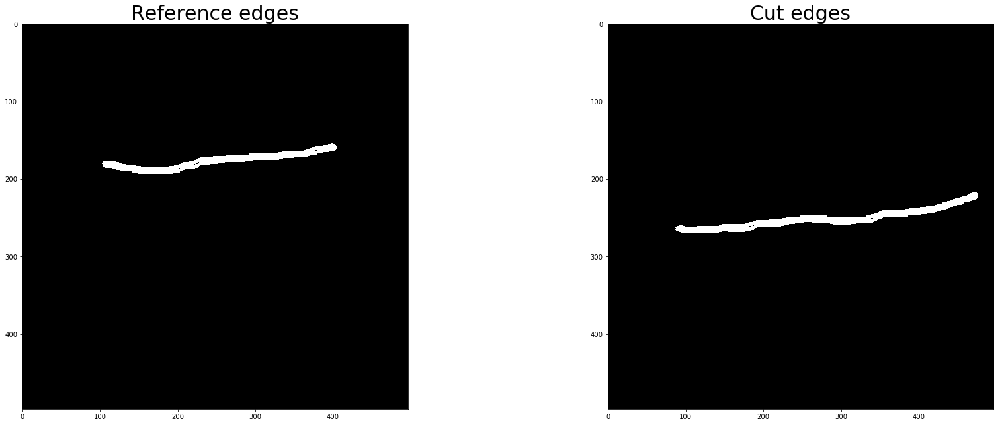

!!!!Saved the top edge!!!! 161
!!!!Saved the bottom!!!!  219
Reade the folloiwn items from 
file ../data/12-12-2018/images/al3/params/al3_side3_params.csv
['crop_top', 'crop_bottom', 'crop_left', 'crop_right', 'thresh_low', 'thresh_high', 'pix2mm']
0 0 0 0 50 255 13.845
!!!!!!!!!!!MAKE SURE ABOUT SCALINGS, PIX2MM, and CROPPING!!!!!!!!!!!


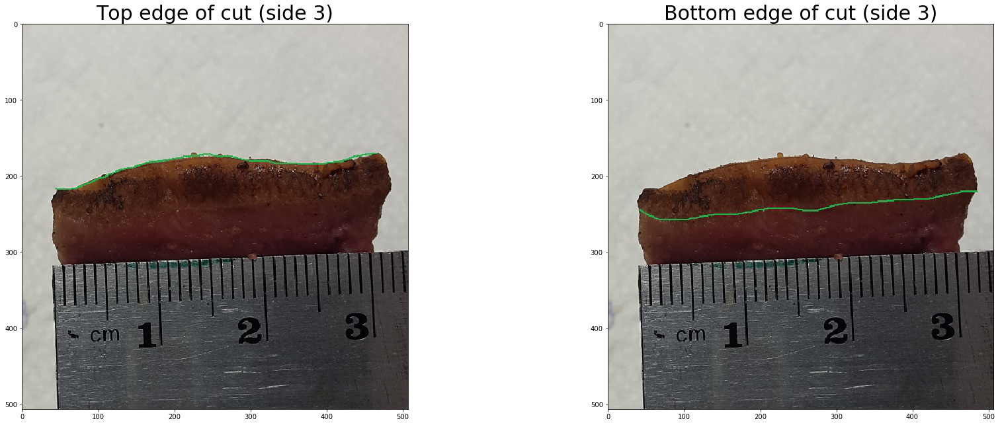

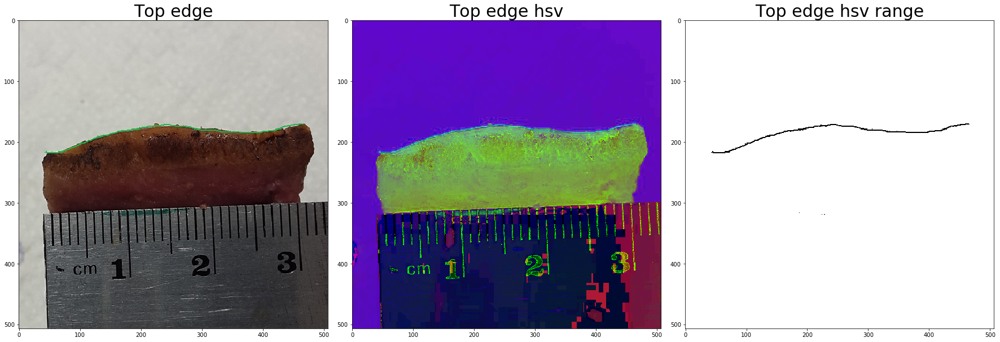

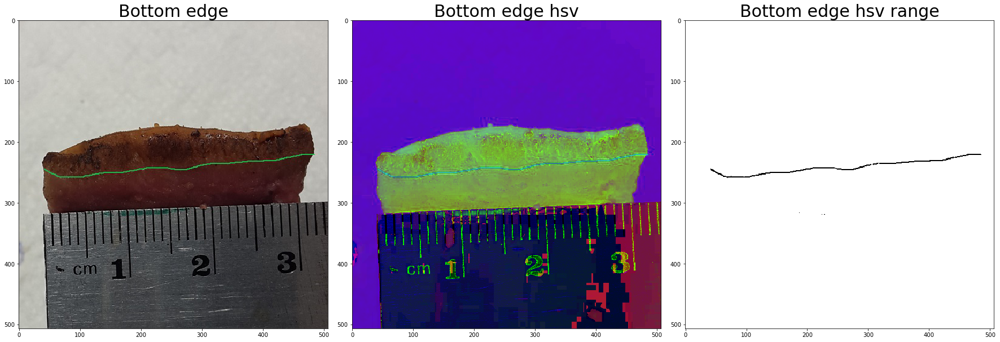

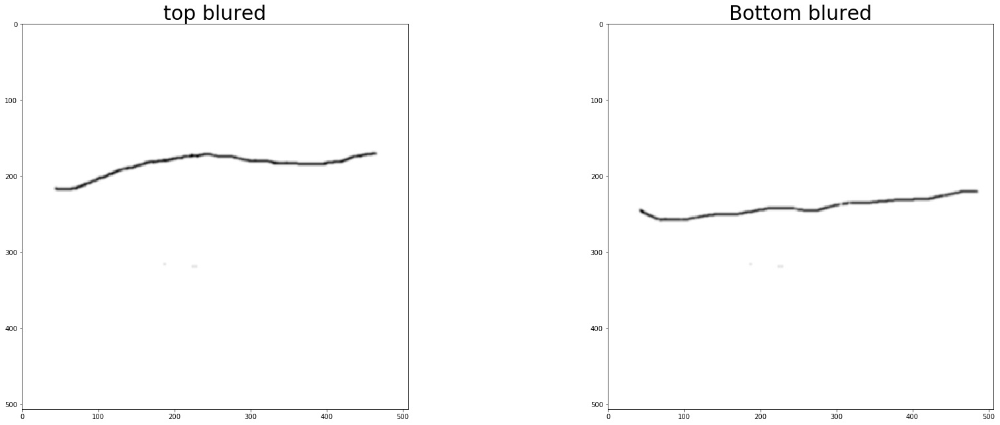

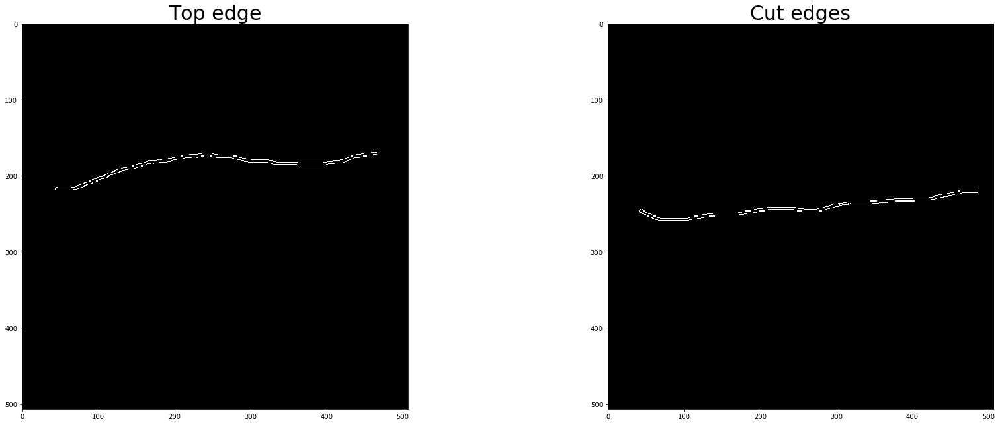

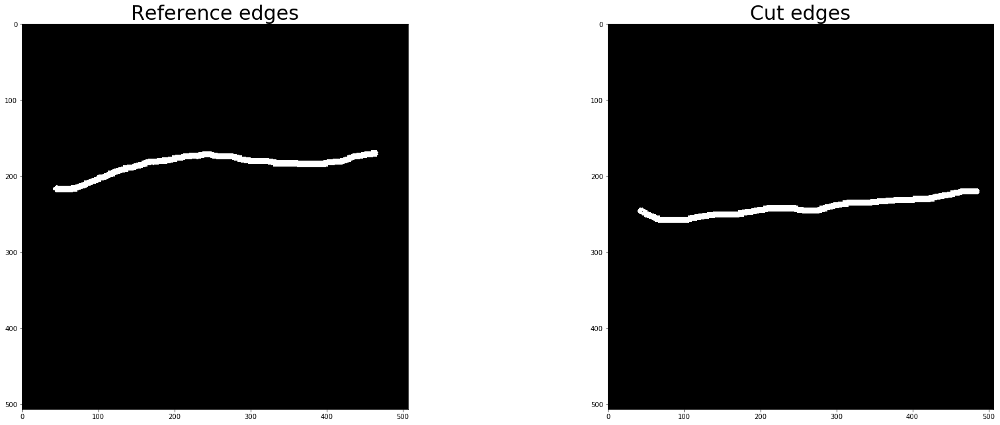

!!!!Saved the top edge!!!! 600
!!!!Saved the bottom!!!!  294
Reade the folloiwn items from 
file ../data/12-12-2018/images/al3/params/al3_side4_params.csv
['crop_top', 'crop_bottom', 'crop_left', 'crop_right', 'thresh_low', 'thresh_high', 'pix2mm']
0 0 0 0 50 255 13.529
!!!!!!!!!!!MAKE SURE ABOUT SCALINGS, PIX2MM, and CROPPING!!!!!!!!!!!


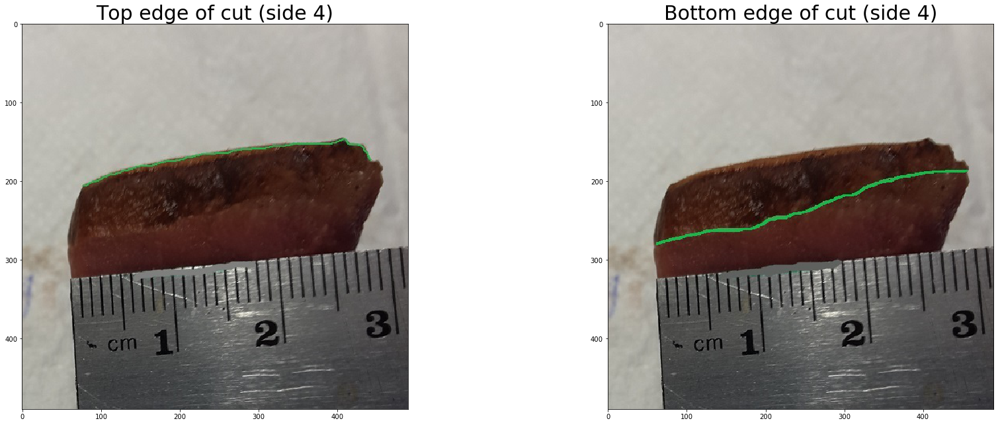

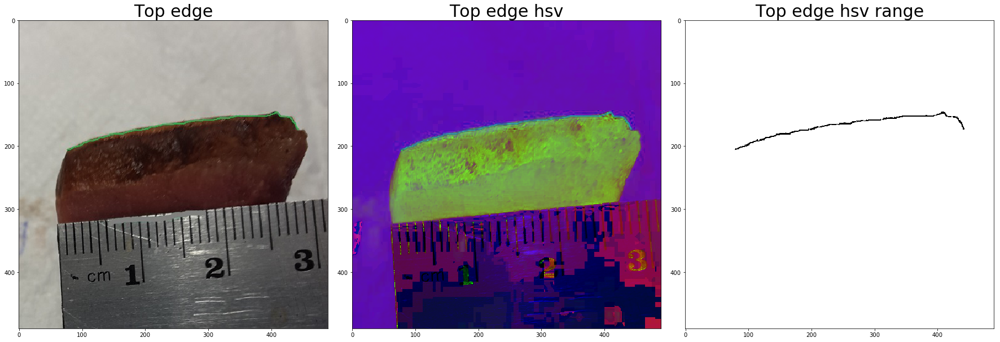

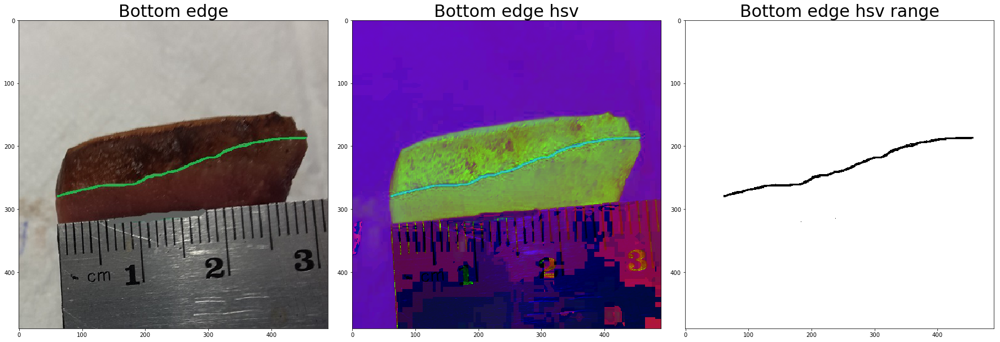

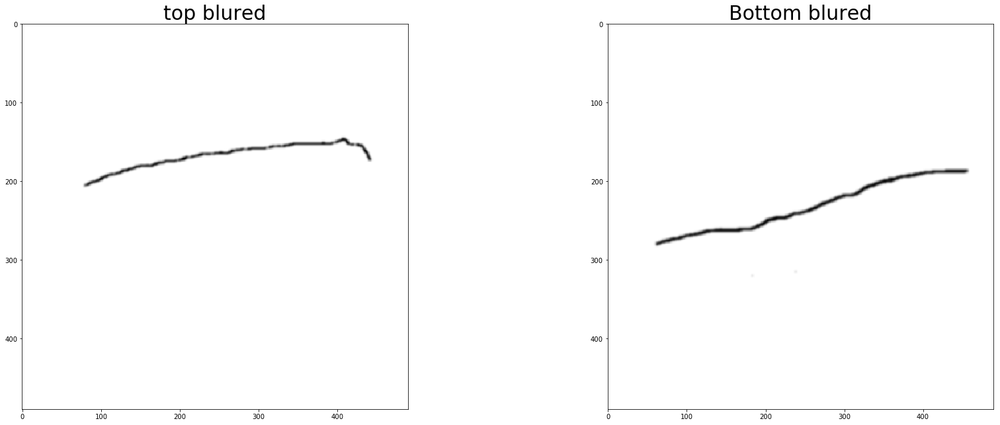

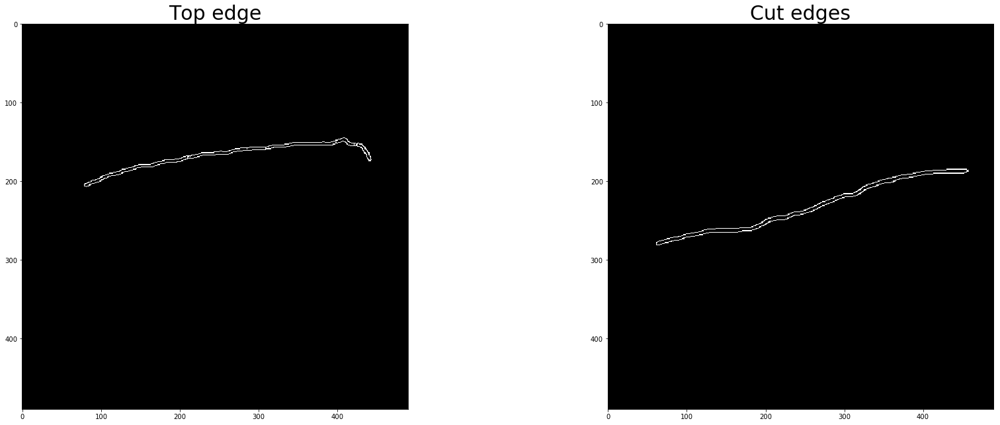

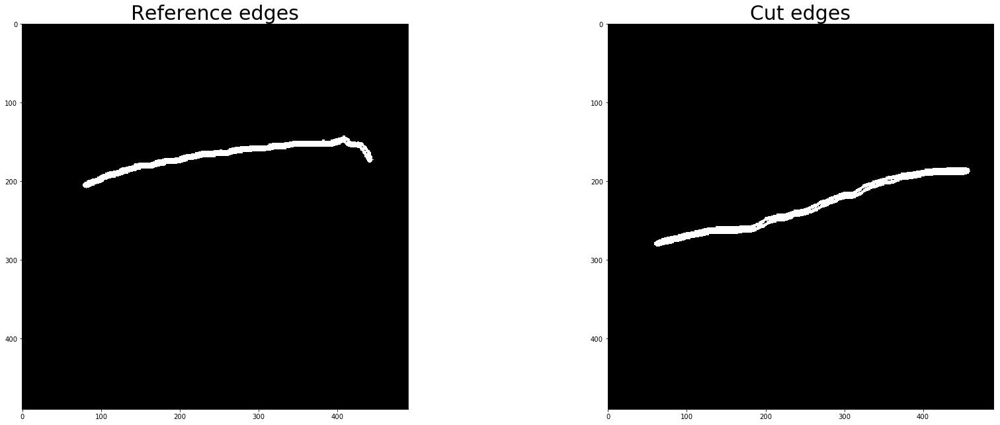

!!!!Saved the top edge!!!! 275
!!!!Saved the bottom!!!!  343


In [5]:
show_steps = True
# for all the four cut sides, extract the top and bottom edges and save pixels
for side_no in range(1,5):
    # read the param files for the side image
    side_params_file_name = source_file_loc+test_date+test_no+"/params/"+test_no+"_side" + str(side_no)+"_params.csv"

    crop_top, crop_bottom, crop_left, crop_right, thresh_low, thresh_high, pix2mm = get_params(side_params_file_name)
    #get_side_params
    print (crop_top, crop_bottom, crop_left, crop_right, thresh_low, thresh_high, pix2mm)
    print("!!!!!!!!!!!MAKE SURE ABOUT SCALINGS, PIX2MM, and CROPPING!!!!!!!!!!!")
    # read the top and bottom edge images
    top_edge_img_name = source_file_loc+test_date+test_no+"/"+test_no+'_side'+ str(side_no)+'_t.jpg'
    top_image = mpimg.imread(top_edge_img_name)
    bottom_edge_img_name = source_file_loc+test_date+test_no+"/"+test_no+'_side'+ str(side_no)+'_b.jpg'
    bottom_image = mpimg.imread(bottom_edge_img_name)
    plot2figs(top_image, 'Top edge of cut (side '+ str(side_no)+')',bottom_image,'Bottom edge of cut (side '+ str(side_no)+')')
    plt.show()

    # apply color thresholing to the top edge image
    top_hsv = get_hsv(top_image);
    top_hsv_range = 255- get_hsv_range(top_hsv,lower_green ,upper_green )
    if(show_steps):
        plot3figs(top_image, 'Top edge',top_hsv,'Top edge hsv', top_hsv_range, "Top edge hsv range")
        plt.show()
    # apply color thresholing to the bottom edge image
    bottom_hsv = get_hsv(bottom_image);
    bottom_hsv_range = 255 - get_hsv_range(bottom_hsv,lower_green ,upper_green )
    if(show_steps):
        plot3figs(bottom_image, 'Bottom edge',bottom_hsv,'Bottom edge hsv', bottom_hsv_range, "Bottom edge hsv range")
        plt.show()


    # crop if necessary
    top_cropped = crop_image(top_hsv_range, crop_top, crop_bottom, crop_left, crop_right)
    bottom_cropped = crop_image(bottom_hsv_range, crop_top, crop_bottom, crop_left, crop_right)
    top_height = top_cropped.shape[0]
    #preparing for Canny
    kernel_size = 7 # Must be an odd number (3, 5, 7...)
    top_blur = gaussian_blur(top_cropped,kernel_size)
    bottom_blur = gaussian_blur(bottom_cropped,kernel_size)
    
    if(show_steps):
        plot2figs(top_blur, 'top blured',bottom_blur,'Bottom blured')
        plt.show()


    top_edge = canny(top_blur, thresh_low, thresh_high)
    bottom_edge = canny(bottom_blur, thresh_low, thresh_high)
    

    if(show_steps):
        plot2figs(top_edge, 'Top edge',bottom_edge,'Cut edges')
        plt.show()

    top_contours_img, top_contours, top_hierarchy = cv2.findContours(top_edge,cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)
    bottom_contours_img, bottom_contours, bottom_hierarchy = cv2.findContours(bottom_edge,cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)

    cv2.drawContours(top_edge, top_contours, 0, (255,0,0), 3)
    cv2.drawContours(bottom_edge, bottom_contours, 0, (255,0,0), 3)
    plot2figs(top_edge, 'Reference edges',bottom_edge,'Cut edges')
    plt.show()

    #saving the results
    top_file_name = results_file_loc+test_date+test_no+"/results/"+test_no+"_side" + str(side_no)+'_top.csv'
    bottom_file_name = results_file_loc+test_date+test_no+"/results/"+test_no+"_side" + str(side_no)+'_bottom.csv'
    top_file = open(top_file_name, 'w')  
    writer3 = csv.writer(top_file)
    for row in range(0, top_contours[0].shape[0]):
        writer3.writerows(top_contours[0][row]/pix2mm)
        top_file.flush()
    top_file.close() 
    print('!!!!Saved the top edge!!!!', top_contours[0].shape[0])
    bottom_file = open(bottom_file_name, 'w')  
    writer4 = csv.writer(bottom_file)
    for row in range(0, bottom_contours[0].shape[0]):
        writer4.writerows(bottom_contours[0][row]/pix2mm)
        bottom_file.flush()
    bottom_file.close() 
    print('!!!!Saved the bottom!!!! ', bottom_contours[0].shape[0])
    
